Importing Libraries

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import blob_log, blob_dog
from skimage import io, color
from matplotlib.patches import Circle
%matplotlib inline

Displaying Grayscale Images

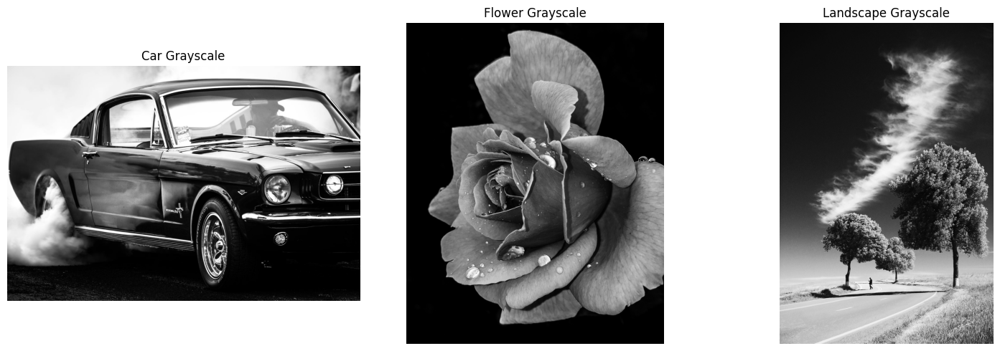

In [ ]:
car_img = io.imread('car_grayscale.jpg')
flower_img = io.imread('flower_grayscale.jpg')
landscape_img = io.imread('landscape_grayscale.jpg')

def display_images(images, titles, cols=3, cmap='gray'):
    rows = len(images) // cols + int(len(images) % cols != 0)
    plt.figure(figsize=(15, 5 * rows))
    for i, (img, title) in enumerate(zip(images, titles)):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img, cmap=cmap)
        plt.title(title)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

images = [car_img, flower_img, landscape_img]
titles = ['Car Grayscale', 'Flower Grayscale', 'Landscape Grayscale']
display_images(images, titles)

Blob detection using log

In [ ]:
def detect_blobs_log(image, min_sigma=1, max_sigma=50, num_sigma=10, threshold=0.1):
    blobs = blob_log(image, min_sigma=min_sigma, max_sigma=max_sigma, num_sigma=num_sigma, threshold=threshold)
    blobs[:, 2] = blobs[:, 2] * np.sqrt(2)
    return blobs

Blob detection using bob

In [ ]:
def detect_blobs_dog(image, min_sigma=1, max_sigma=50, threshold=0.1):
    blobs = blob_dog(image, min_sigma=min_sigma, max_sigma=max_sigma, threshold=threshold)
    blobs[:, 2] = blobs[:, 2] * np.sqrt(2)
    return blobs

In [ ]:
def plot_blobs(image, blobs, title):
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(image, cmap='gray')
    for blob in blobs:
        y, x, r = blob
        c = Circle((x, y), r, color='red', linewidth=2, fill=False)
        ax.add_patch(c)
    plt.title(title)
    plt.axis('off')
    plt.show()

In [ ]:
from skimage import color

def to_grayscale(image):
    if len(image.shape) == 3:
        return color.rgb2gray(image)
    return image

# Convert images to grayscale if necessary
car_img = to_grayscale(car_img)
flower_img = to_grayscale(flower_img)
landscape_img = to_grayscale(landscape_img)

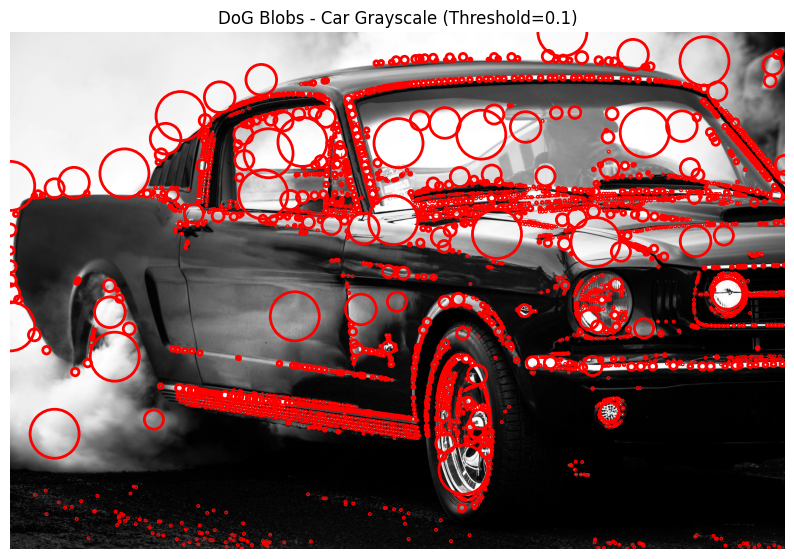

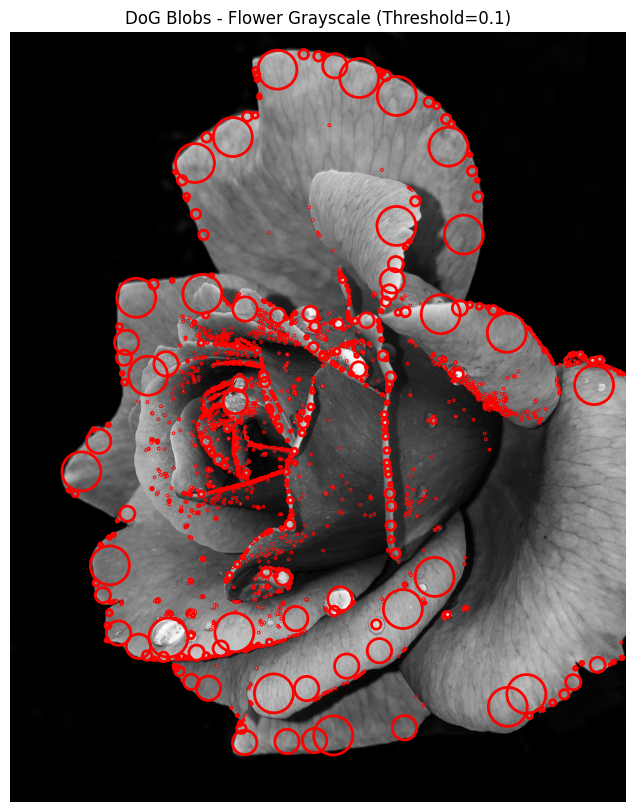

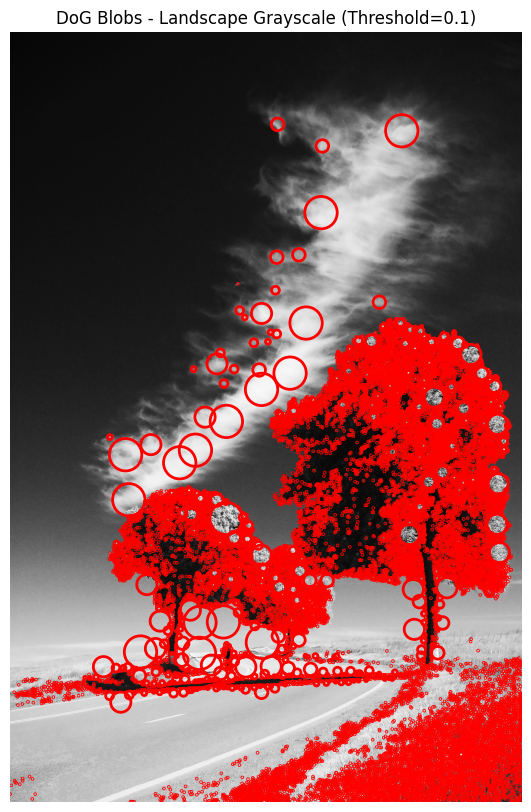

In [ ]:
# Define images and their titles
image_list = [
    (car_img, 'Car Grayscale'),
    (flower_img, 'Flower Grayscale'),
    (landscape_img, 'Landscape Grayscale')
]

# Initial threshold
initial_threshold = 0.1

for img, title in image_list:

    # DoG Detection
    blobs_dog = detect_blobs_dog(img, threshold=initial_threshold)
    plot_blobs(img, blobs_dog, f'DoG Blobs - {title} (Threshold={initial_threshold})')

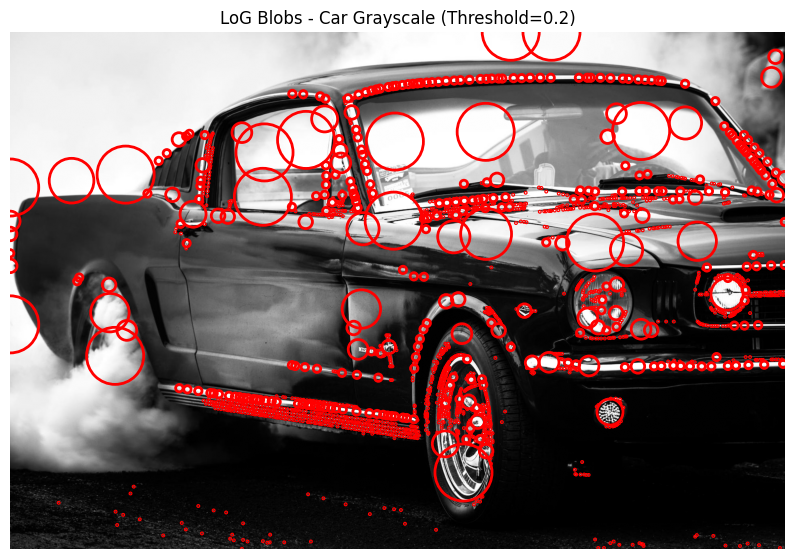

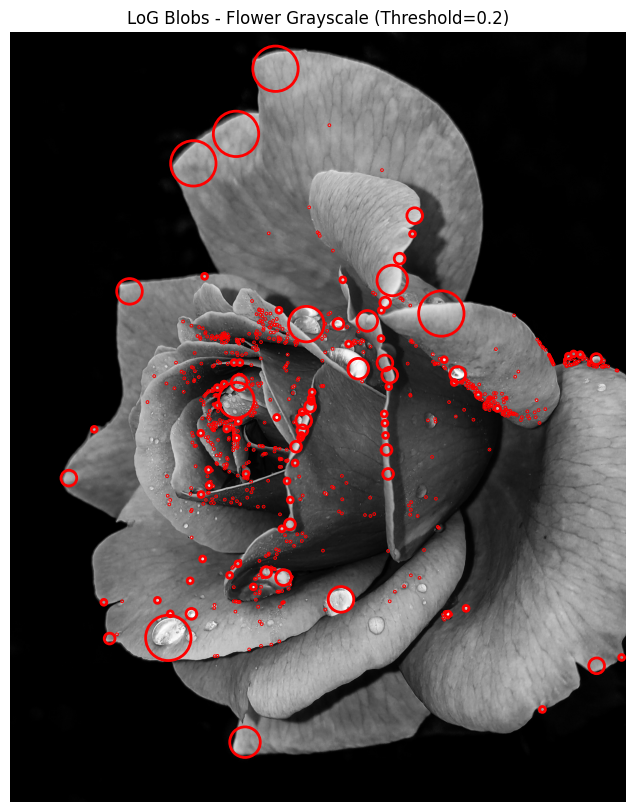

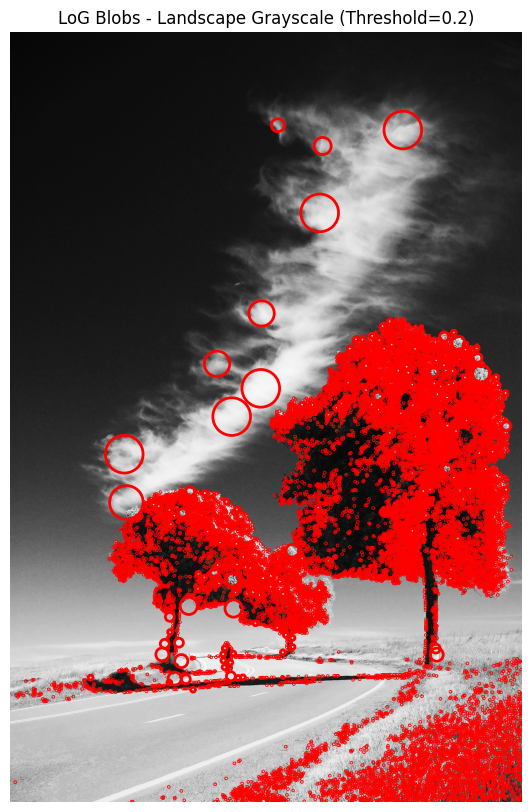

In [ ]:
# Define images and their titles
image_list = [
    (car_img, 'Car Grayscale'),
    (flower_img, 'Flower Grayscale'),
    (landscape_img, 'Landscape Grayscale')
]

# Initial threshold
initial_threshold = 0.2

for img, title in image_list:
    # LoG Detection
    blobs_log = detect_blobs_log(img, threshold=initial_threshold)
    plot_blobs(img, blobs_log, f'LoG Blobs - {title} (Threshold={initial_threshold})')


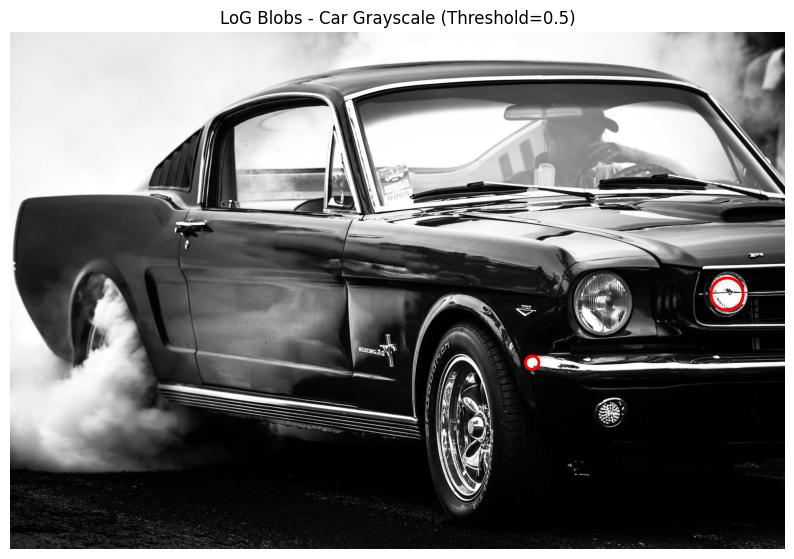

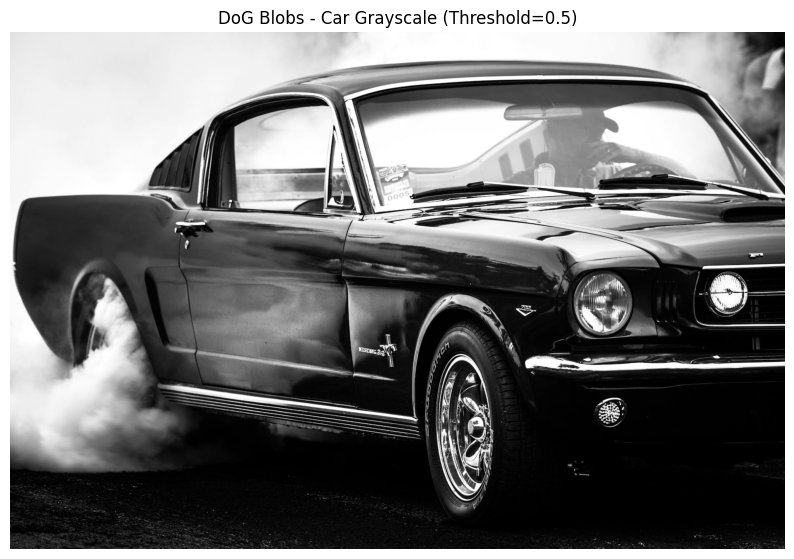

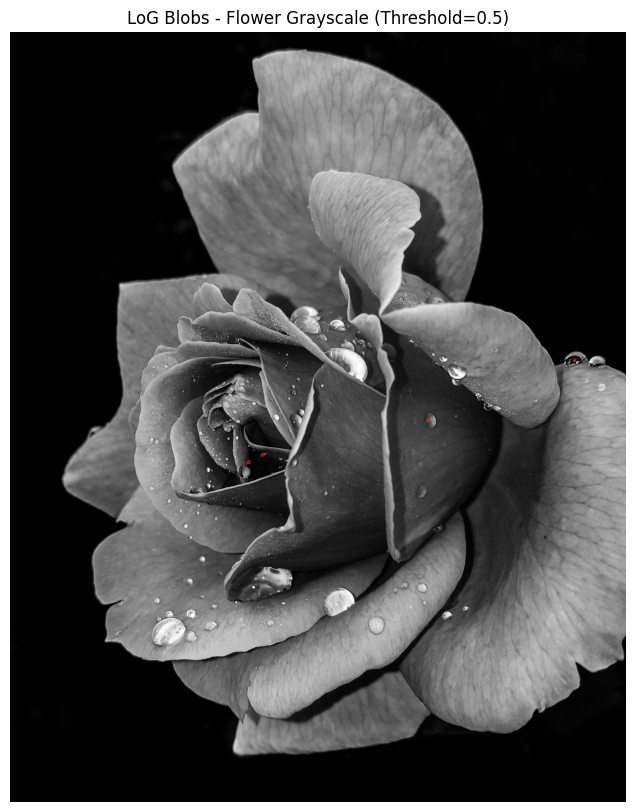

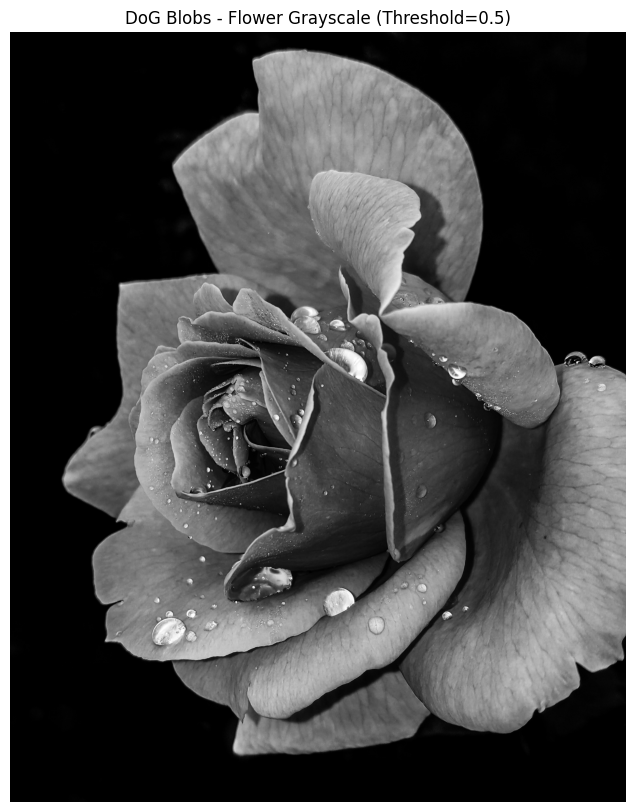

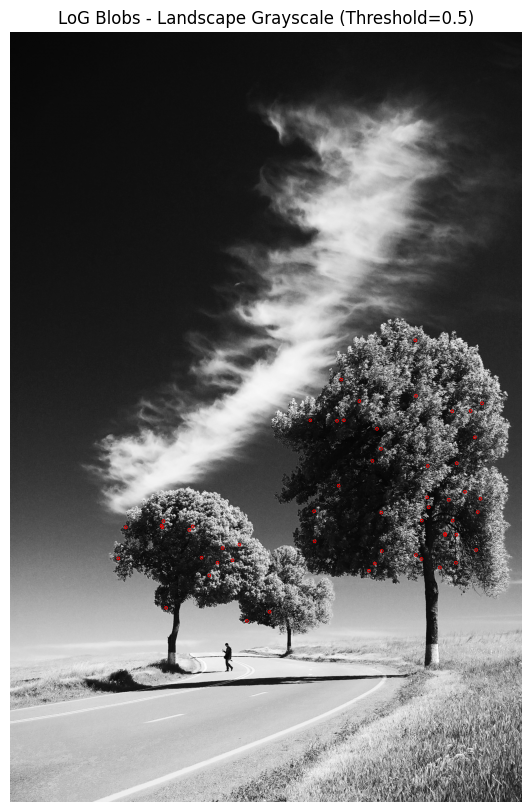

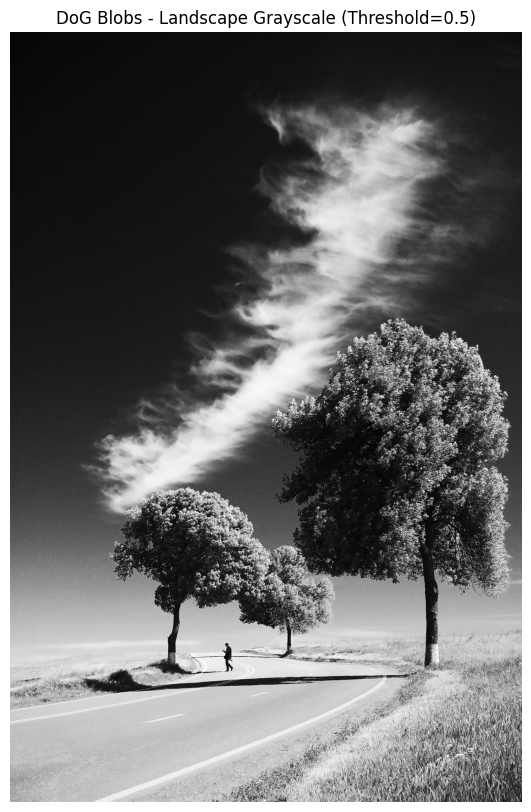

In [ ]:
# Define images and their titles
image_list = [
    (car_img, 'Car Grayscale'),
    (flower_img, 'Flower Grayscale'),
    (landscape_img, 'Landscape Grayscale')
]

# Initial threshold
initial_threshold = 0.5

for img, title in image_list:
    # LoG Detection
    blobs_log = detect_blobs_log(img, threshold=initial_threshold)
    plot_blobs(img, blobs_log, f'LoG Blobs - {title} (Threshold={initial_threshold})')

    # DoG Detection
    blobs_dog = detect_blobs_dog(img, threshold=initial_threshold)
    plot_blobs(img, blobs_dog, f'DoG Blobs - {title} (Threshold={initial_threshold})')


In [ ]:
# Load images in grayscale mode
car_img = cv2.imread('car_grayscale.jpg', cv2.IMREAD_GRAYSCALE)
flower_img = cv2.imread('flower_grayscale.jpg', cv2.IMREAD_GRAYSCALE)
landscape_img = cv2.imread('landscape_grayscale.jpg', cv2.IMREAD_GRAYSCALE)

# Function to verify and convert image to 8-bit if necessary
def ensure_uint8(image):
    if image is None:
        raise ValueError("Image not found or unable to load.")
    if image.dtype != np.uint8:
        # If image is float, scale it to [0,255] and convert to uint8
        if np.issubdtype(image.dtype, np.floating):
            image = np.clip(image, 0, 1)  # Ensure values are within [0,1]
            image = (image * 255).astype(np.uint8)
        else:
            # For other types, normalize and convert to uint8
            image = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX)
            image = image.astype(np.uint8)
    return image

# Apply the verification and conversion
car_img = ensure_uint8(car_img)
flower_img = ensure_uint8(flower_img)
landscape_img = ensure_uint8(landscape_img)

# Verify that images are loaded and converted
print("Image Shapes and Data Types:")
print(f"Car Image: {car_img.shape}, Data Type: {car_img.dtype}")
print(f"Flower Image: {flower_img.shape}, Data Type: {flower_img.dtype}")
print(f"Landscape Image: {landscape_img.shape}, Data Type: {landscape_img.dtype}")

Image Shapes and Data Types:
Car Image: (1282, 1920), Data Type: uint8
Flower Image: (2400, 1920), Data Type: uint8
Landscape Image: (2888, 1920), Data Type: uint8


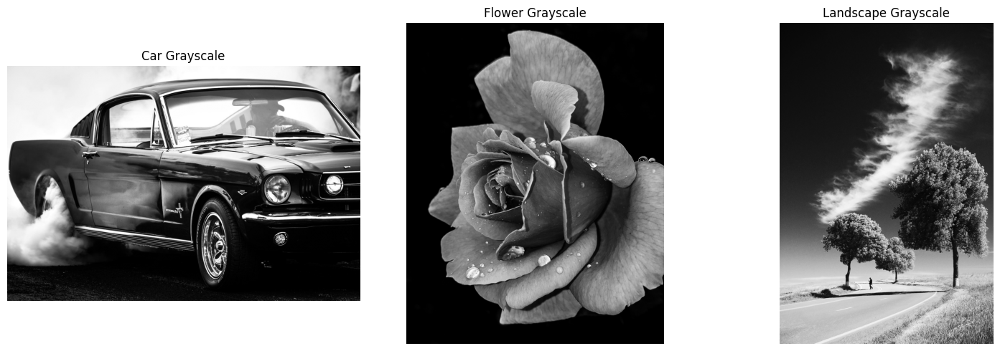

In [ ]:
# Function to display images
def display_images(images, titles, cols=3, cmap='gray'):
    rows = len(images) // cols + int(len(images) % cols != 0)
    plt.figure(figsize=(15, 5 * rows))
    for i, (img, title) in enumerate(zip(images, titles)):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img, cmap=cmap)
        plt.title(title)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# List of images and their titles
images = [car_img, flower_img, landscape_img]
titles = ['Car Grayscale', 'Flower Grayscale', 'Landscape Grayscale']

# Display the images
display_images(images, titles)

In [ ]:
def configure_blob_detector(min_area=100, max_area=1000, threshold=10):
    # Initialize parameters
    params = cv2.SimpleBlobDetector_Params()

    # Change thresholds
    params.minThreshold = threshold
    params.maxThreshold = 255  # Upper bound for thresholding

    # Filter by Area
    params.filterByArea = True
    params.minArea = min_area
    params.maxArea = max_area

    # You can enable or disable other filters as needed
    params.filterByCircularity = False
    params.filterByConvexity = False
    params.filterByInertia = False

    # Create a detector with the parameters
    detector = cv2.SimpleBlobDetector_create(params)
    return detector

# Default parameters
default_min_area = 100
default_max_area = 1000
default_threshold = 10

detector = configure_blob_detector(min_area=default_min_area,
                                  max_area=default_max_area,
                                  threshold=default_threshold)

print(f"Blob Detector Parameters:\nMin Area: {default_min_area}\nMax Area: {default_max_area}\nThreshold: {default_threshold}")


Blob Detector Parameters:
Min Area: 100
Max Area: 1000
Threshold: 10


In [ ]:
def detect_and_draw_blobs(image, detector, title):
    # Detect blobs
    keypoints = detector.detect(image)

    # Create a color image to draw blobs
    image_with_blobs = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)

    # Draw detected blobs as red circles
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.imshow(cv2.cvtColor(image_with_blobs, cv2.COLOR_BGR2RGB))
    for keypoint in keypoints:
        x, y = keypoint.pt
        s = keypoint.size
        c = Circle((x, y), s/2, color='red', linewidth=2, fill=False)
        ax.add_patch(c)

    # Display the image with blobs
    ax.set_title(f'{title} - Detected Blobs: {len(keypoints)}')
    ax.axis('off')
    plt.show()


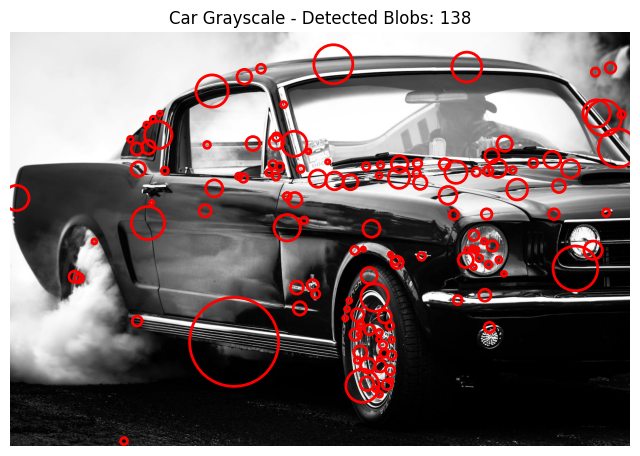

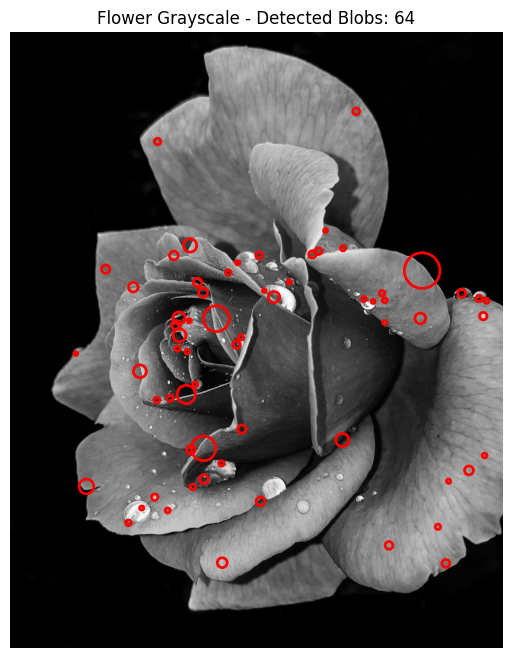

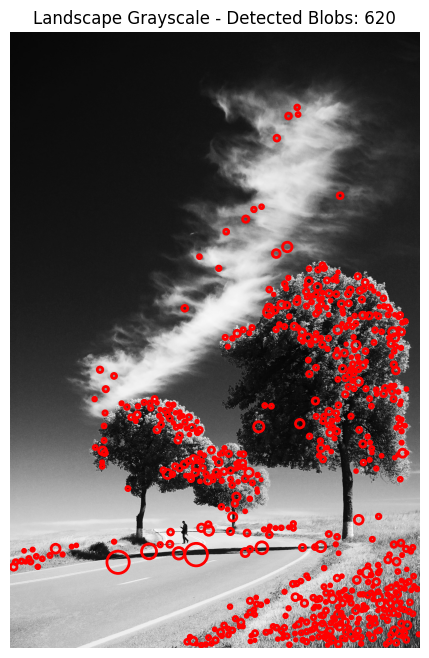

In [ ]:
# Define images and titles
image_list = [
    (car_img, 'Car Grayscale'),
    (flower_img, 'Flower Grayscale'),
    (landscape_img, 'Landscape Grayscale')
]

# Detect and draw blobs for each image
for img, title in image_list:
    detect_and_draw_blobs(img, detector, title)


In [ ]:
def experiment_with_parameters(image, title, min_area, max_area, threshold):
    # Configure detector with new parameters
    detector = configure_blob_detector(min_area=min_area,
                                      max_area=max_area,
                                      threshold=threshold)

    # Detect and draw blobs
    detect_and_draw_blobs(image, detector, f"{title}\n(minArea={min_area}, maxArea={max_area}, threshold={threshold})")



=== Testing with minArea=50, maxArea=500, threshold=5 ===


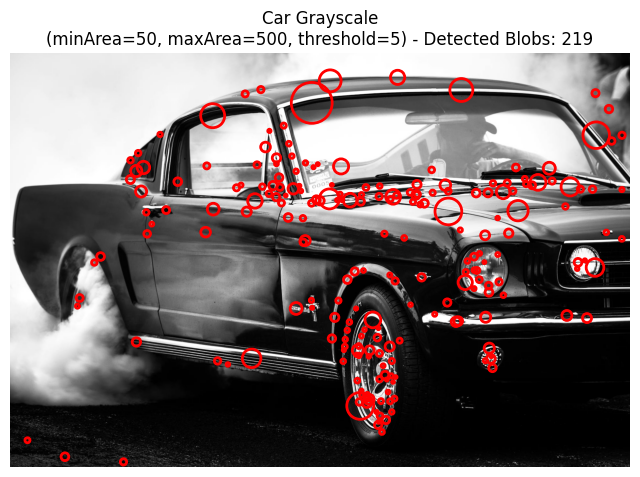

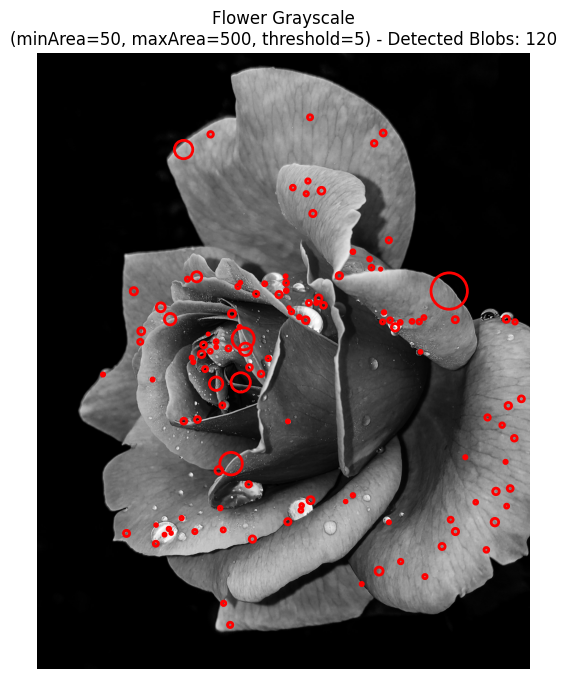

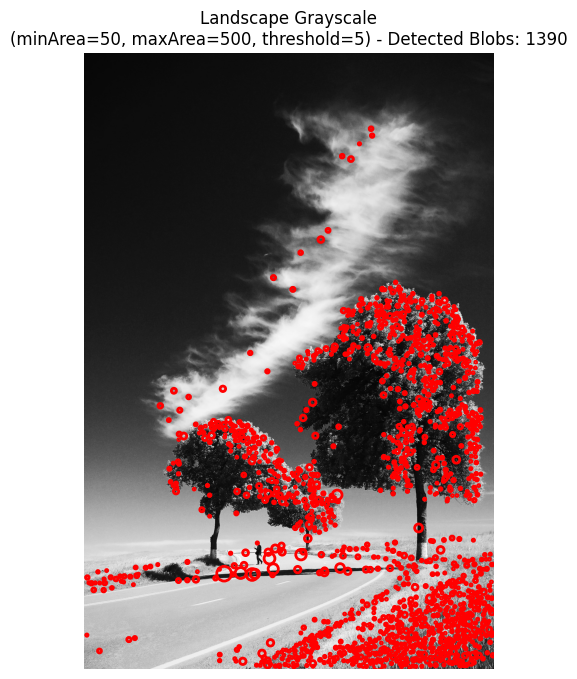


=== Testing with minArea=100, maxArea=1000, threshold=10 ===


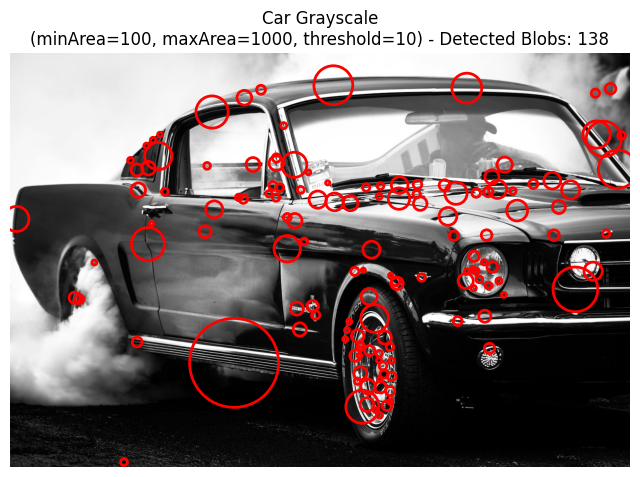

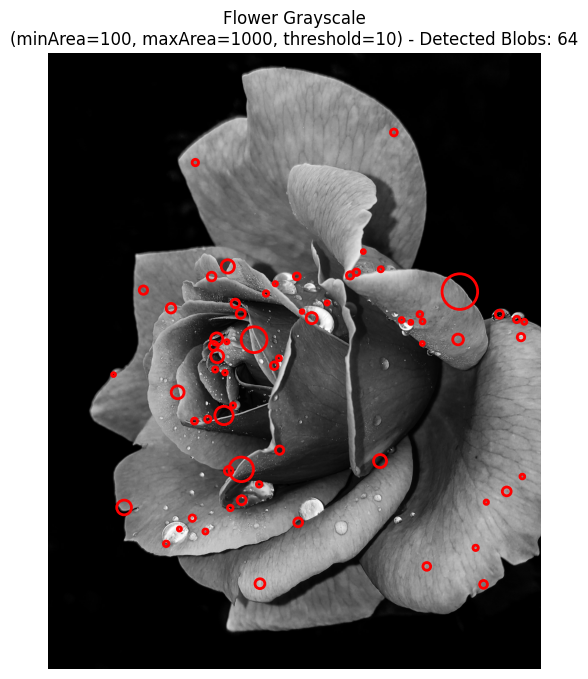

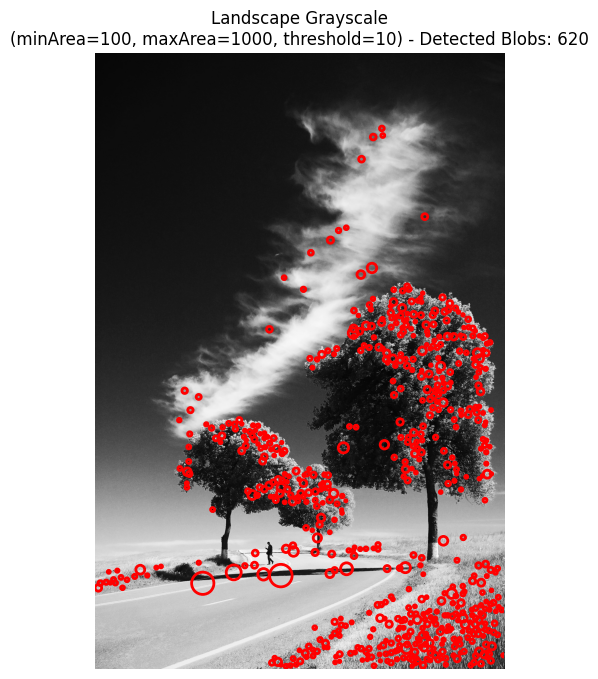


=== Testing with minArea=200, maxArea=1500, threshold=15 ===


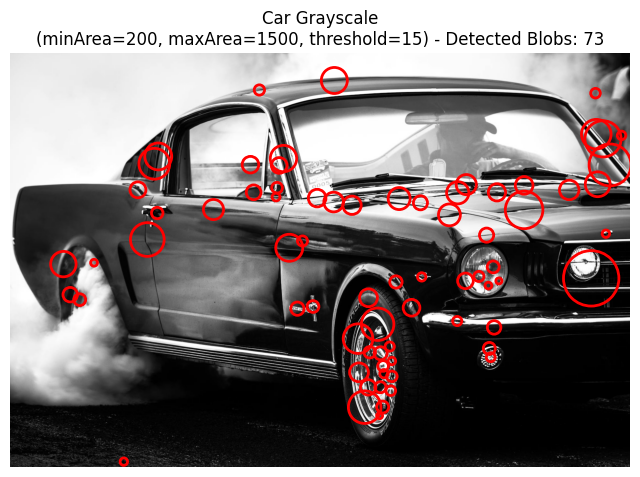

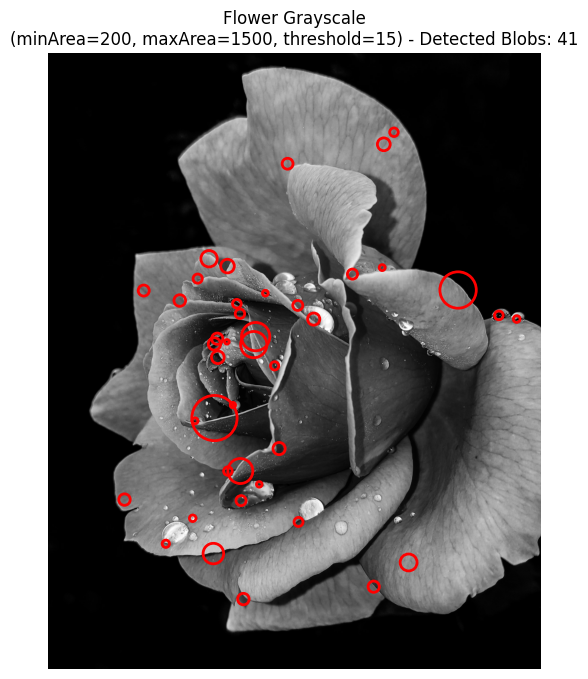

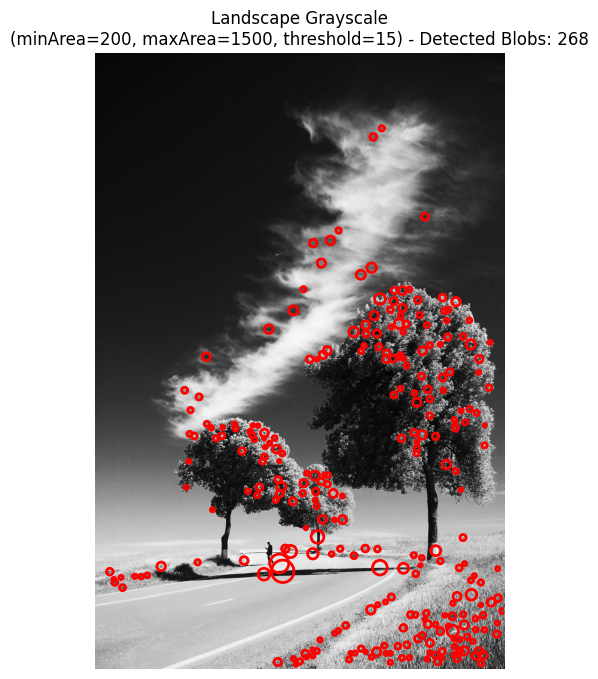


=== Testing with minArea=300, maxArea=2000, threshold=20 ===


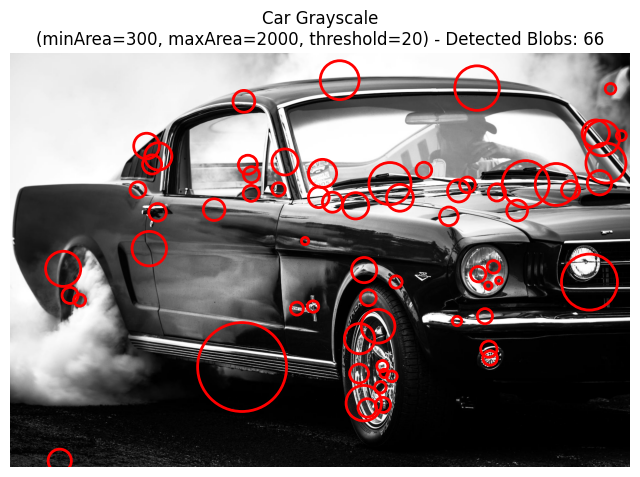

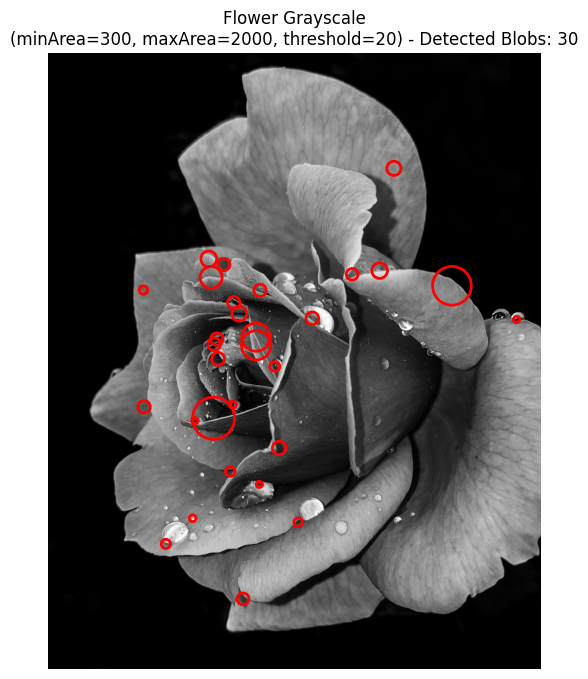

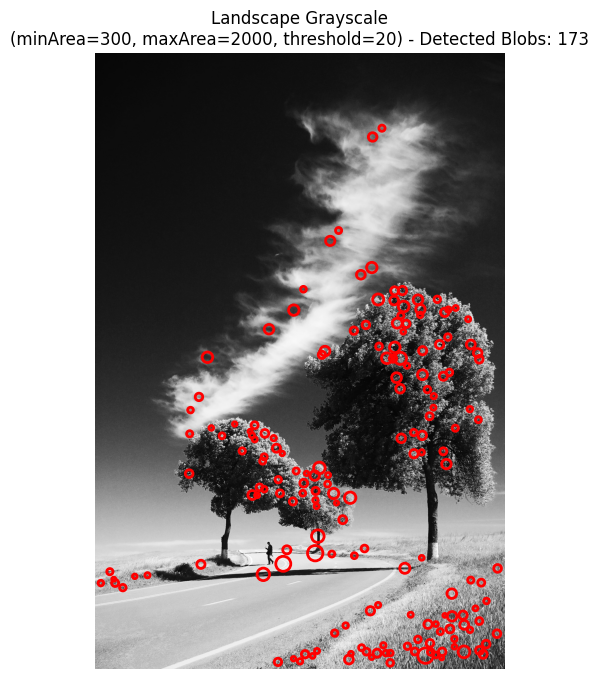

In [ ]:
# Define parameter sets to experiment with
parameter_sets = [
    {'min_area': 50, 'max_area': 500, 'threshold': 5},
    {'min_area': 100, 'max_area': 1000, 'threshold': 10},
    {'min_area': 200, 'max_area': 1500, 'threshold': 15},
    {'min_area': 300, 'max_area': 2000, 'threshold': 20},
]

# Iterate over each parameter set and apply to all images
for params in parameter_sets:
    print(f"\n=== Testing with minArea={params['min_area']}, maxArea={params['max_area']}, threshold={params['threshold']} ===")
    for img, title in image_list:
        experiment_with_parameters(img, title,
                                   min_area=params['min_area'],
                                   max_area=params['max_area'],
                                   threshold=params['threshold'])
